<a href="https://colab.research.google.com/github/djbradyAtOpticalSciencesArizona/computationalImaging/blob/master/sampling/interpolation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Interpolation

## David Brady
## University of Arizona
## Spring 2023

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
from scipy.interpolate import interp1d
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams.update({'font.size': 22})


In [2]:
!pip install tensorflow==2.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 516.3/516.3 MB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 35.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.0/26.0 MB 33.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 454.6/454.6 KB 33.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 39.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.9/152.9 KB 19.7 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2.9.0:
      Successfully uninstalled tensorflow-estimator-2.9.0
  Attempting uninstall: scipy
    Found existing installation: scipy 1.7.3
    Uninstalling scipy-1.7.3:
      Successfully uninstalled scipy-1.7.3
  Attempting uninstall: h5py
    Found existing installation: h

In [30]:
!pip install tensorflow-addons~=0.9
!pip install keras==2.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 191.9/191.9 KB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 KB 5.6 MB/s eta 0:00:00
  Created wheel for keras: filename=Keras-2.0.0-py3-none-any.whl size=227982 sha256=4ee1ba893112d5ae5d3c234687f58c4166d4628869648b30ad4b871ee7ffce69
  Stored in directory: /root/.cache/pip/wheels/5f/59/44/cff5267249d7781722b028516dac2616d9202cfec04a93e6ae
Successfully built keras
  Attempting uninstall: keras-preprocessing
    Found existing installation: Keras-Preprocessing 1.0.1
    Uninstalling Keras-Preprocessing-1.0.1:
      Successfully uninstalled Keras-Preprocessing-1.0.1
  Attempting uninstall: keras
    Found existing installation: Keras 2.2.0
    Uninstalling Keras-2.2.0:
      Succ

Interpolation is a fundamental requirement for display of sampled data. According to the sampling theorem, a bandlimited signal sampled at a rate in excess of the Nyquist rate is exactly represented at
$$
f(x)=\sum_n f(n\Delta ){\rm sinc}\left (\frac{x}{\Delta}-n\right )
$$
Given $f(n\Delta)$, one must use this formula to accurately estimate the signal a intermediate points.  For example, consider the function $\sin (x+\phi)$ as sampled for various $\phi $ below.


### raw samples

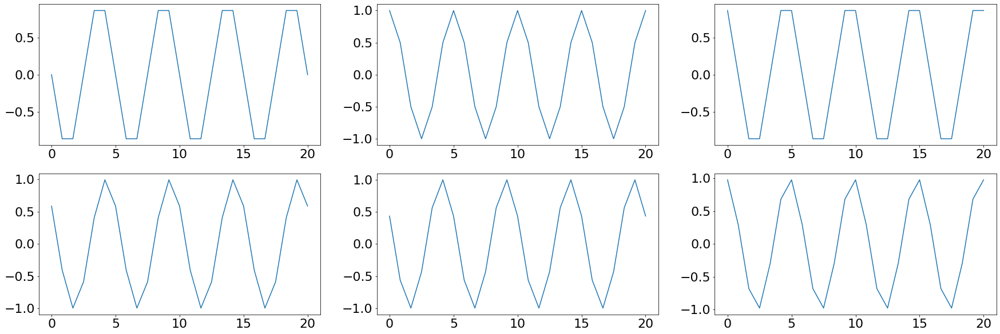

In [38]:
plt.figure(figsize=(30,10))
x=np.linspace(0,20,25)
plt.subplot(2,3,1)
fn=np.sin(2*np.pi*x)
plt.plot(x,fn)
plt.subplot(2,3,2)
fn=np.sin(2*np.pi*x+np.pi/2)
plt.plot(x,fn)
plt.subplot(2,3,3)
fn=np.sin(2*np.pi*x+np.pi/3)
plt.plot(x,fn)
plt.subplot(2,3,4)
fn=np.sin(2*np.pi*x+np.pi/5)
plt.plot(x,fn)
plt.subplot(2,3,5)
fn=np.sin(2*np.pi*x+np.pi/7)
plt.plot(x,fn)
plt.subplot(2,3,6)
fn=np.sin(2*np.pi*x+3*np.pi/7)
plt.plot(x,fn)


### linear interplation

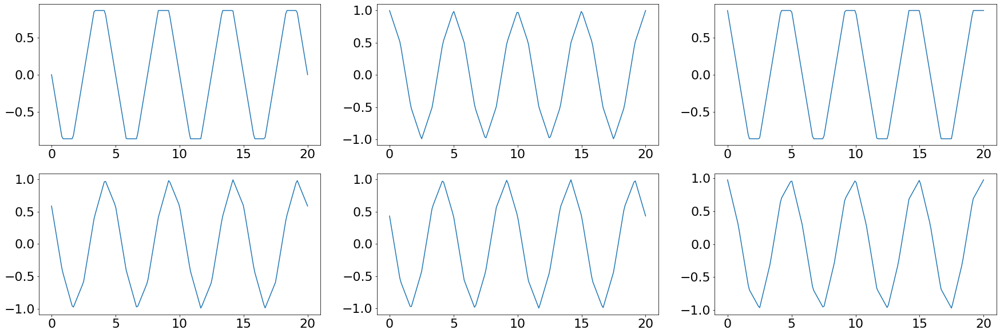

In [60]:
plt.figure(figsize=(30,10))
k='linear'
x=np.linspace(0,20,25)
plt.subplot(2,3,1)
fn=np.sin(2*np.pi*x)
fnew=interp1d(x,fn,kind=k)
xnew=np.linspace(0,20,200)
plt.plot(xnew,fnew(xnew))
plt.subplot(2,3,2)
fn=np.sin(2*np.pi*x+np.pi/2)
fnew=interp1d(x,fn,kind=k)
xnew=np.linspace(0,20,200)
plt.plot(xnew,fnew(xnew))
plt.subplot(2,3,3)
fn=np.sin(2*np.pi*x+np.pi/3)
fnew=interp1d(x,fn,kind=k)
xnew=np.linspace(0,20,200)
plt.plot(xnew,fnew(xnew))
plt.subplot(2,3,4)
fn=np.sin(2*np.pi*x+np.pi/5)
fnew=interp1d(x,fn,kind=k)
xnew=np.linspace(0,20,200)
plt.plot(xnew,fnew(xnew))
plt.subplot(2,3,5)
fn=np.sin(2*np.pi*x+np.pi/7)
fnew=interp1d(x,fn,kind=k)
xnew=np.linspace(0,20,200)
plt.plot(xnew,fnew(xnew))
plt.subplot(2,3,6)
fn=np.sin(2*np.pi*x+3*np.pi/7)
fnew=interp1d(x,fn,kind=k)
xnew=np.linspace(0,20,200)
plt.plot(xnew,fnew(xnew))

### spline interpolation

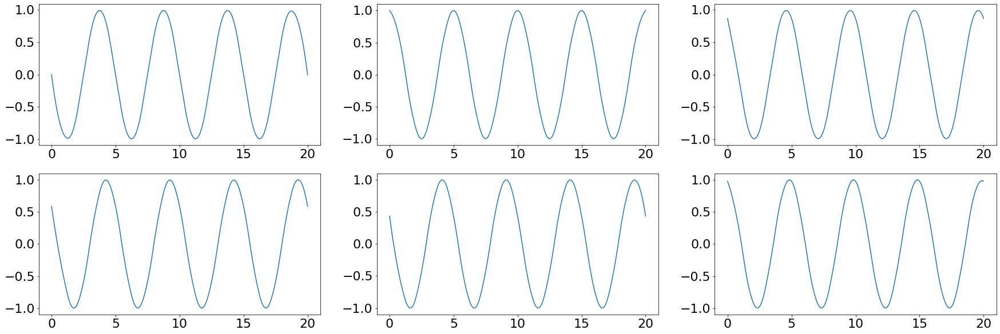

In [46]:
plt.figure(figsize=(30,10))
k='quadratic'
x=np.linspace(0,20,25)
plt.subplot(2,3,1)
fn=np.sin(2*np.pi*x)
fnew=interp1d(x,fn,kind=k)
xnew=np.linspace(0,20,200)
plt.plot(xnew,fnew(xnew))
plt.subplot(2,3,2)
fn=np.sin(2*np.pi*x+np.pi/2)
fnew=interp1d(x,fn,kind=k)
xnew=np.linspace(0,20,200)
plt.plot(xnew,fnew(xnew))
plt.subplot(2,3,3)
fn=np.sin(2*np.pi*x+np.pi/3)
fnew=interp1d(x,fn,kind=k)
xnew=np.linspace(0,20,200)
plt.plot(xnew,fnew(xnew))
plt.subplot(2,3,4)
fn=np.sin(2*np.pi*x+np.pi/5)
fnew=interp1d(x,fn,kind=k)
xnew=np.linspace(0,20,200)
plt.plot(xnew,fnew(xnew))
plt.subplot(2,3,5)
fn=np.sin(2*np.pi*x+np.pi/7)
fnew=interp1d(x,fn,kind=k)
xnew=np.linspace(0,20,200)
plt.plot(xnew,fnew(xnew))
plt.subplot(2,3,6)
fn=np.sin(2*np.pi*x+3*np.pi/7)
fnew=interp1d(x,fn,kind=k)
xnew=np.linspace(0,20,200)
plt.plot(xnew,fnew(xnew))


# Image interpolation using artificial neural networks. 

Using code from https://github.com/krasserm/super-resolution we consider image upsampling using 

[Enhanced Deep Residual Networks for Single Image Super-Resolution (EDSR)](https://arxiv.org/abs/1707.02921)

[Wide Activation for Efficient and Accurate Image Super-Resolution (WDSR)](https://arxiv.org/abs/1808.08718) and

[Photo-Realistic Single Image Super-Resolution Using a Generative Adversarial Network(SRGAN)](https://arxiv.org/abs/1808.08718)


## models

In [3]:
! wget https://github.com/krasserm/super-resolution/archive/refs/heads/master.zip
! unzip -q master.zip

--2023-01-30 04:06:10--  https://github.com/krasserm/super-resolution/archive/refs/heads/master.zip
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/krasserm/super-resolution/zip/refs/heads/master [following]
--2023-01-30 04:06:10--  https://codeload.github.com/krasserm/super-resolution/zip/refs/heads/master
Resolving codeload.github.com (codeload.github.com)... 20.27.177.114
Connecting to codeload.github.com (codeload.github.com)|20.27.177.114|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘master.zip’

master.zip              [    <=>             ]   8.25M  12.2MB/s    in 0.7s    

2023-01-30 04:06:12 (12.2 MB/s) - ‘master.zip’ saved [8655167]



In [5]:
ls

master.zip  sample_data/  super-resolution-master/


In [4]:
cd super-resolution-master/

/content/super-resolution-master


### pretrained weights

In [5]:
!wget https://martin-krasser.de/sisr/weights-edsr-16-x4.tar.gz
!wget https://martin-krasser.de/sisr/weights-wdsr-b-32-x4.tar.gz 
!wget https://martin-krasser.de/sisr/weights-srgan.tar.gz 

--2023-01-30 04:06:24--  https://martin-krasser.de/sisr/weights-edsr-16-x4.tar.gz
Resolving martin-krasser.de (martin-krasser.de)... 217.160.0.142, 2001:8d8:100f:f000::209
Connecting to martin-krasser.de (martin-krasser.de)|217.160.0.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5653330 (5.4M) [application/gzip]
Saving to: ‘weights-edsr-16-x4.tar.gz’

weights-edsr-16-x4. 100%[===================>]   5.39M  2.25MB/s    in 2.4s    

2023-01-30 04:06:27 (2.25 MB/s) - ‘weights-edsr-16-x4.tar.gz’ saved [5653330/5653330]

--2023-01-30 04:06:28--  https://martin-krasser.de/sisr/weights-wdsr-b-32-x4.tar.gz
Resolving martin-krasser.de (martin-krasser.de)... 217.160.0.142, 2001:8d8:100f:f000::209
Connecting to martin-krasser.de (martin-krasser.de)|217.160.0.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2328140 (2.2M) [application/gzip]
Saving to: ‘weights-wdsr-b-32-x4.tar.gz’

weights-wdsr-b-32-x 100%[===================>]   2.22M  

In [6]:
!tar xvfz weights-edsr-16-x4.tar.gz
!tar xvfz weights-wdsr-b-32-x4.tar.gz 
!tar xvfz weights-srgan.tar.gz 

weights/
weights/edsr-16-x4/
weights/edsr-16-x4/weights.h5
weights/
weights/wdsr-b-32-x4/
weights/wdsr-b-32-x4/weights.h5
weights/srgan/gan_discriminator.h5
weights/srgan/gan_generator.h5
weights/srgan/pre_generator.h5


# test images

In [7]:
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/A.png'
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/fabric.png'

--2023-01-30 04:06:55--  https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/A.png
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/A.png [following]
--2023-01-30 04:06:55--  https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/A.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 516405 (504K) [image/png]
Saving to: ‘A.png’

A.png               100%[===================>] 504.30K  --.-KB/s    in 0.04s   

2023-01-30 04:06:55 (11.3 MB/s) - ‘A.pn

In [8]:
a=cv2.imread('A.png')
fabric=cv2.imread('fabric.png')

## image estimation using EDSR

In [11]:
from model import resolve_single
from model.edsr import edsr

from utils import load_image, plot_sample

model = edsr(scale=4, num_res_blocks=16)
model.load_weights('weights/edsr-16-x4/weights.h5')


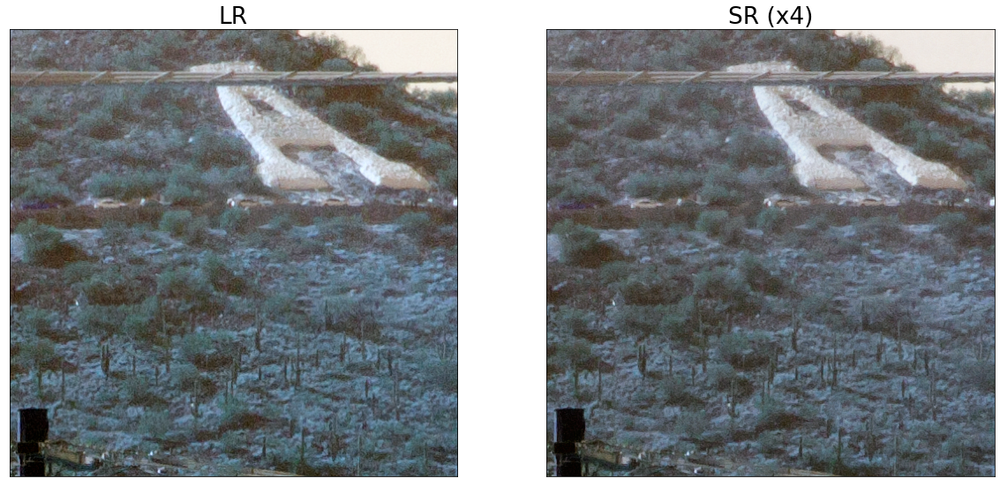

In [13]:
srAEDSR = resolve_single(model, a)

plot_sample(a, srEDSR)

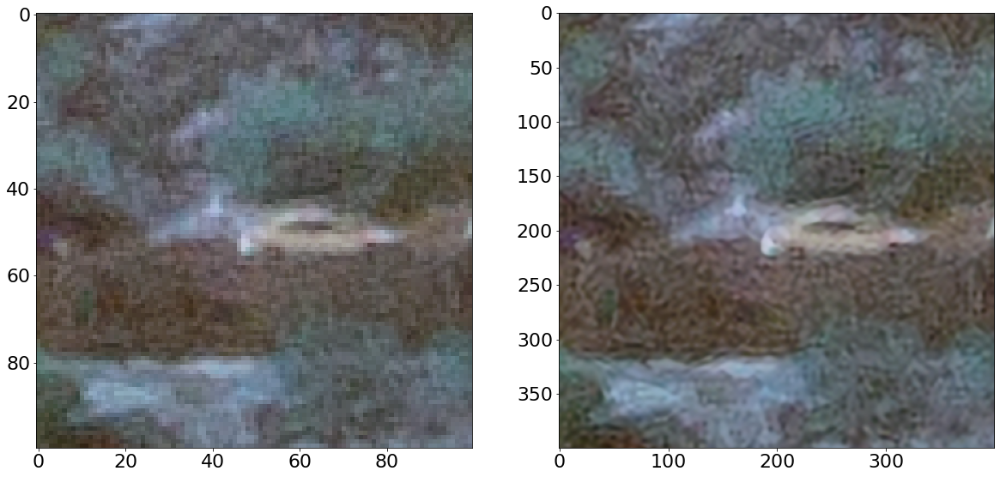

In [50]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(a[150:250,50:150])
plt.subplot(1,2,2)
plt.imshow(srEDSR[600:1000,200:600])

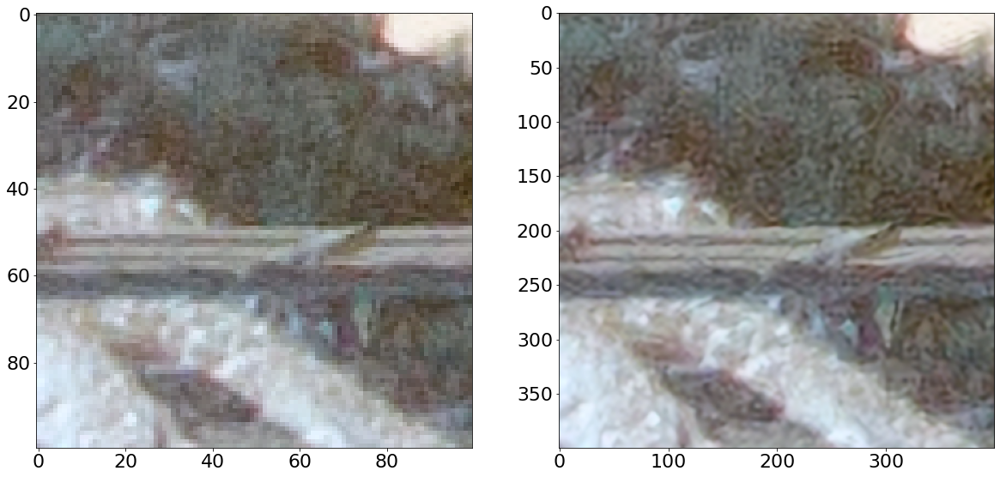

In [51]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(a[0:100,250:350])
plt.subplot(1,2,2)
plt.imshow(srEDSR[0:400,1000:1400])

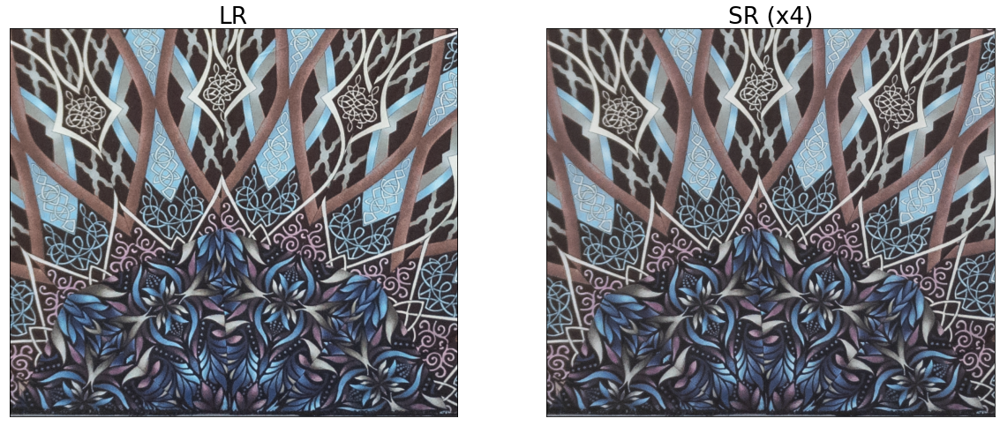

In [14]:
srFab = resolve_single(model, fabric)

plot_sample(fabric, srFab)

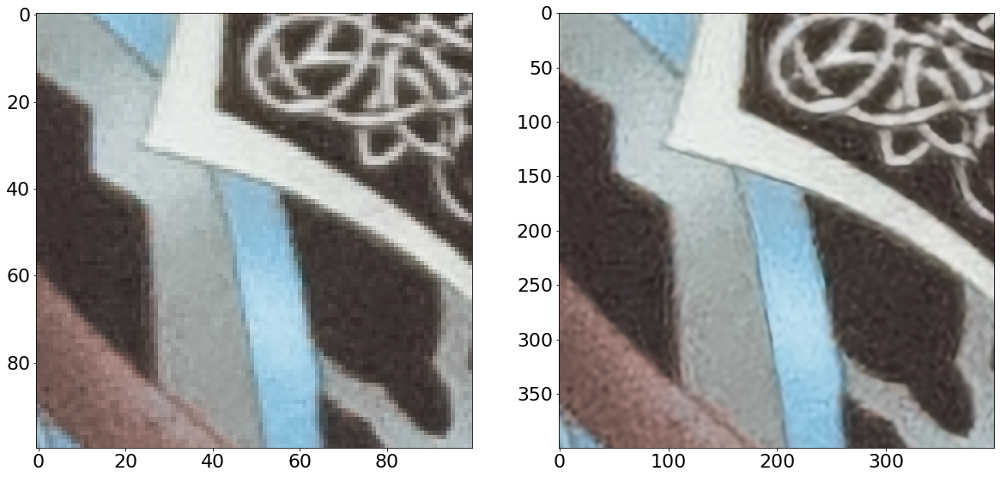

In [56]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(fabric[150:250,50:150])
plt.subplot(1,2,2)
plt.imshow(srFab[600:1000,200:600])

## image estimation using SRGAN

In [13]:
from model import resolve_single
from utils import load_image, plot_sample
from model.srgan import generator

model = generator()
model.load_weights('weights/srgan/gan_generator.h5')



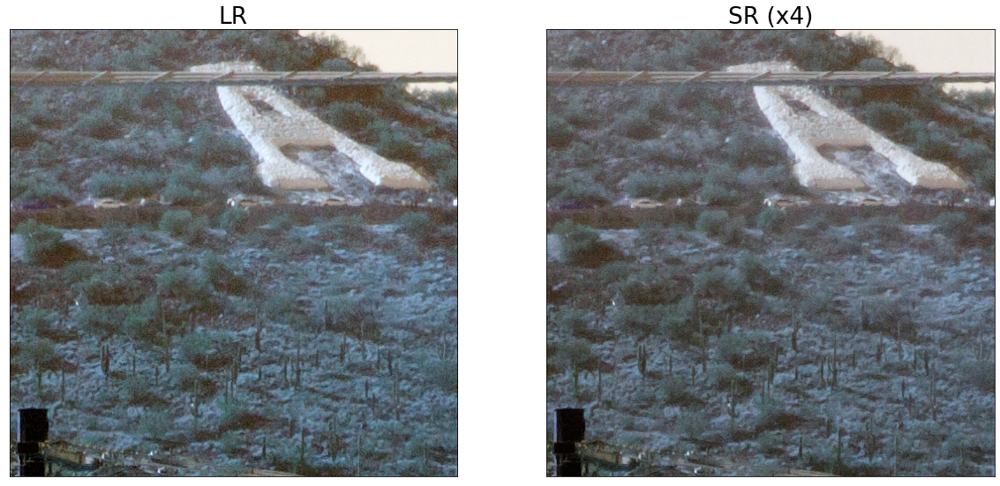

In [14]:
srSRGAN = resolve_single(model, a)

plot_sample(a, srSRGAN)

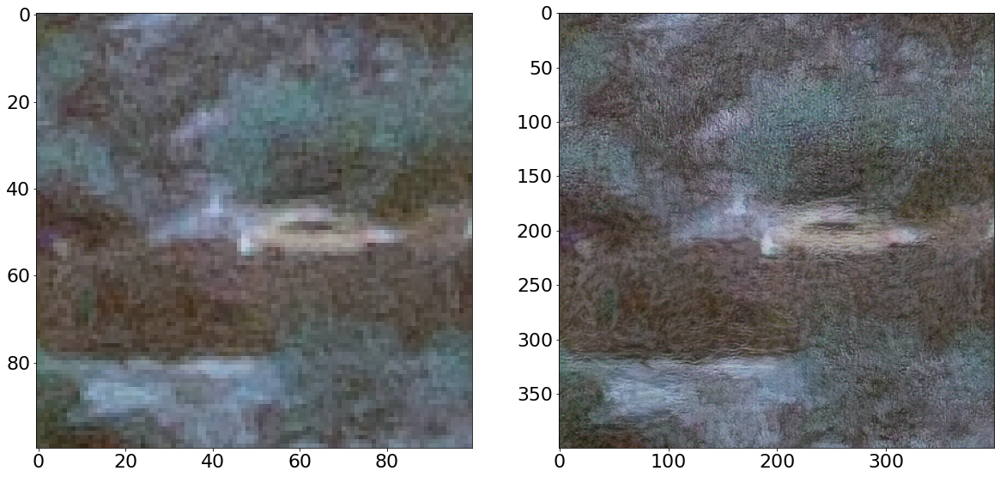

In [17]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(a[150:250,50:150])
plt.subplot(1,2,2)
plt.imshow(srSRGAN[600:1000,200:600])

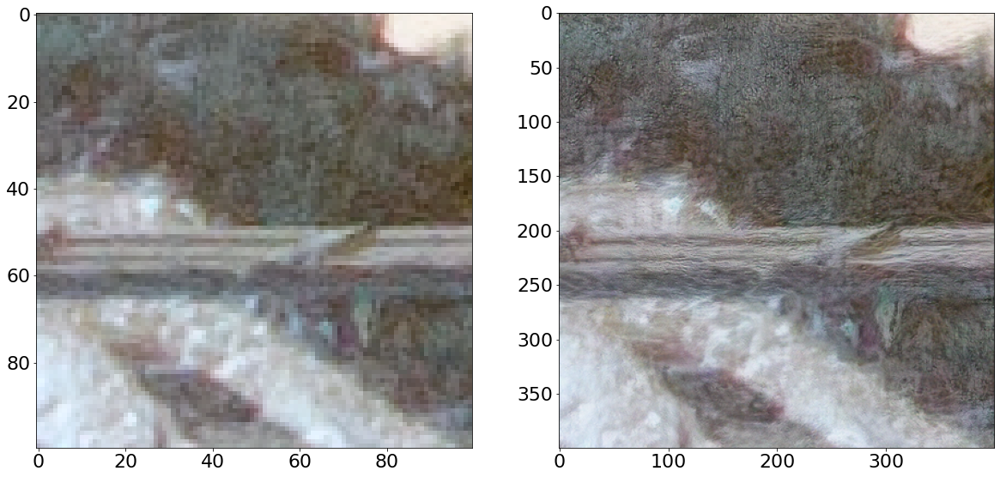

In [18]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(a[0:100,250:350])
plt.subplot(1,2,2)
plt.imshow(srSRGAN[0:400,1000:1400])

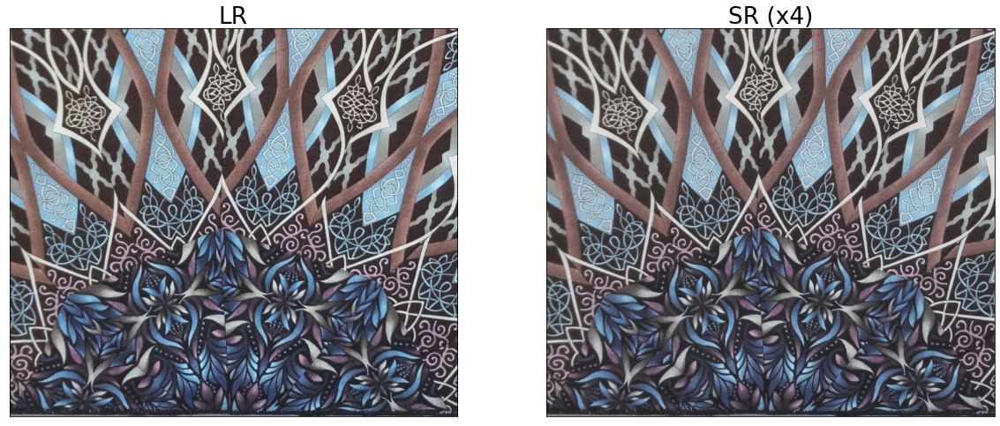

In [19]:
srFabGAN = resolve_single(model, fabric)

plot_sample(fabric, srFabGAN)

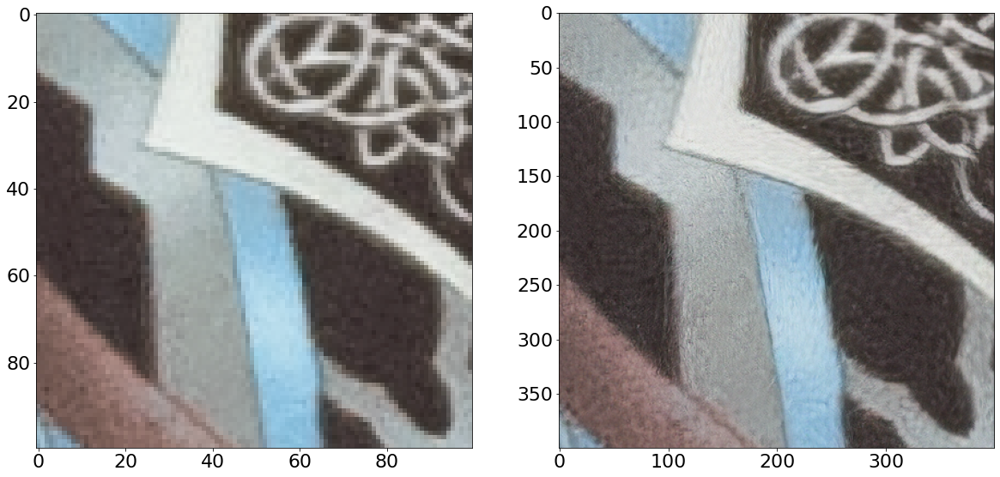

In [32]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(fabric[150:250,50:150])
plt.subplot(1,2,2)
plt.imshow(srFabGAN[600:1000,200:600])

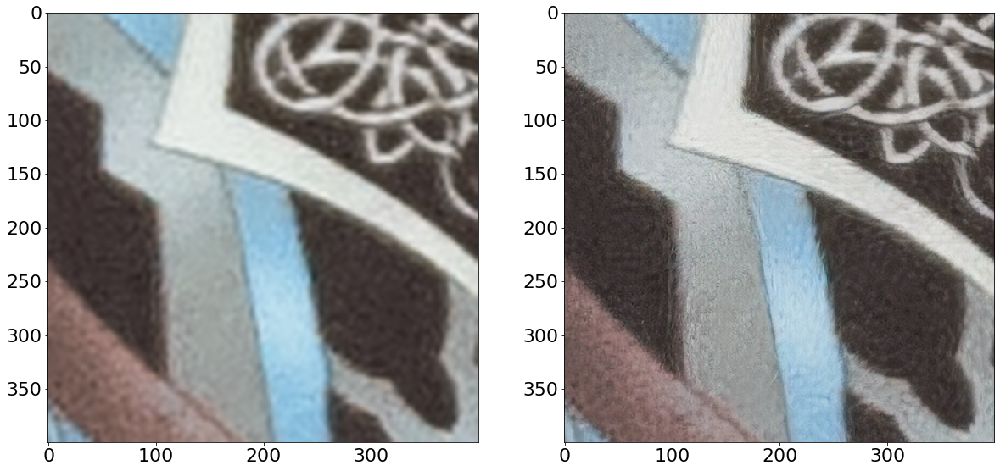

In [34]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(cv2.resize(fabric[150:250,50:150],(400,400),interpolation = cv2.INTER_LANCZOS4))
plt.subplot(1,2,2)
plt.imshow(srFabGAN[600:1000,200:600])

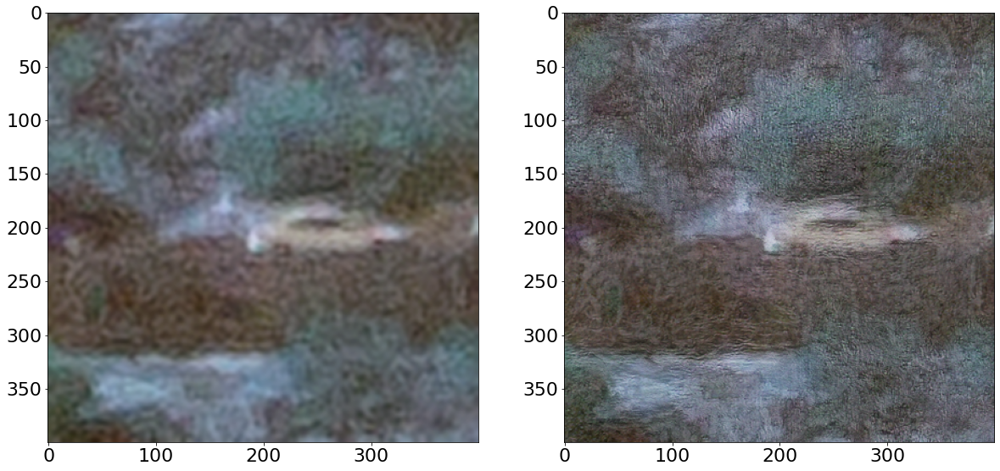

In [35]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(cv2.resize(a[150:250,50:150],(400,400),interpolation = cv2.INTER_LANCZOS4))
plt.subplot(1,2,2)
plt.imshow(srSRGAN[600:1000,200:600])

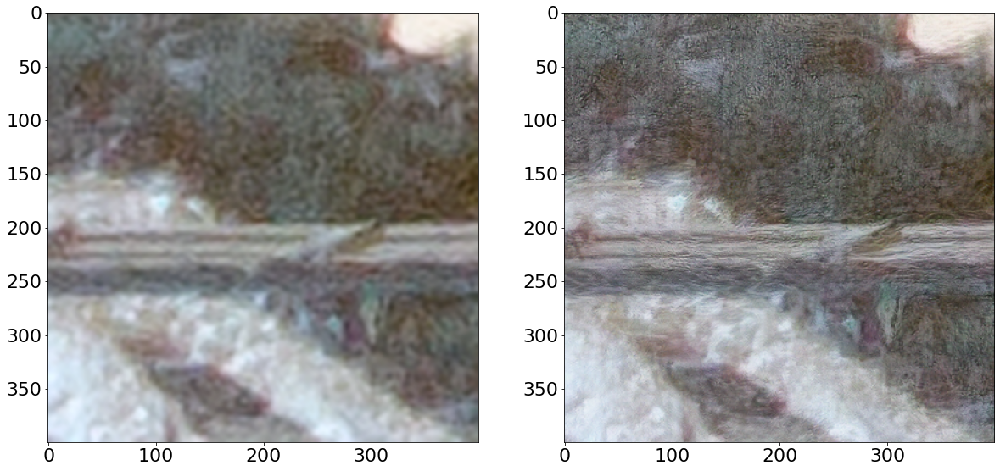

In [37]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(cv2.resize(a[0:100,250:350],(400,400),interpolation = cv2.INTER_LANCZOS4))
plt.subplot(1,2,2)
plt.imshow(srSRGAN[0:400,1000:1400])